# Canny Edge Detector

Length of contours 20


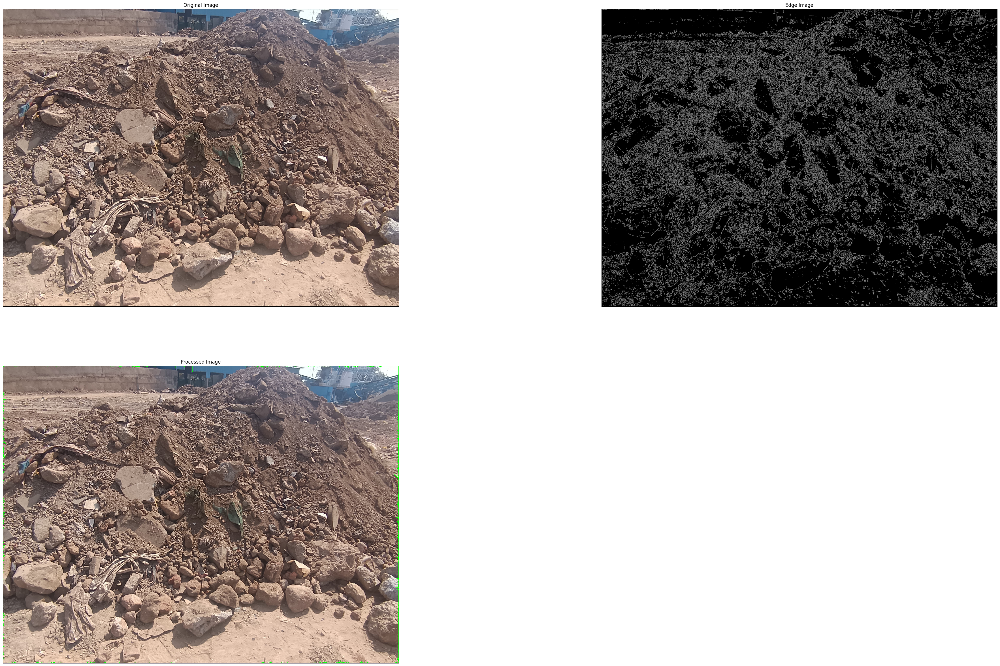

In [14]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

def binary_transform(image):
    img = image

    # convert the input image to grayscale
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    edges = cv.Canny(gray, 100, 100) 

    # apply thresholding to convert grayscale to binary image
    # ret,thresh = cv2.threshold(gray,70,255,0)
    ret, binary = cv.threshold(edges, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)
    return binary



image = cv.imread('2.jpeg') 
#Now convert the grayscale image to binary image
binary=binary_transform(image)
binary=cv.bitwise_not(binary)

#Now detect the contours
contours, hierarchy = cv.findContours(binary, mode=cv.RETR_EXTERNAL, method=cv.CHAIN_APPROX_NONE)

#Visualize the data structure
print("Length of contours {}".format(len(contours)))
# print(contours)

# draw contours on the original image
image_copy = image.copy()
image_copy = cv.drawContours(image_copy, contours, -1, (0, 255, 0), thickness=2, lineType=cv.LINE_AA)
 
plt.figure(figsize=(50, 30))
plt.subplot(2,2,1),plt.imshow(cv.cvtColor(image,cv.COLOR_BGR2RGB))
plt.title('Original Image'), plt.xticks([]), plt.yticks([])

plt.subplot(2,2 ,2),plt.imshow(cv.cvtColor(edges,cv.COLOR_BGR2RGB))
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.subplot(2,2,3),plt.imshow(cv.cvtColor(image_copy,cv.COLOR_BGR2RGB))
plt.title('Processed Image'), plt.xticks([]), plt.yticks([])
plt.show()

# cv.imshow('Drawn Contours', image_copy)
# cv.waitKey(0)
# cv.destroyAllWindows()
 

## Contours at different blur and contour values

In [15]:
import cv2
def blurContour(image,blurval,conval):
    image = cv2.blur(image,(blurval,blurval))
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, conval, conval) 
    #Now convert the grayscale image to binary image
    ret, binary = cv2.threshold(edges, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    #Now detect the contours
    contours, hierarchy = cv2.findContours(binary, mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_NONE)
    return contours


In [4]:
import cv2
import numpy
import copy

rows=[5]
cols=[30]
image = cv2.imread('2.jpeg')
image = cv2.resize(image, None, fx=0.25,fy=0.25)

i=1
size=12
plt.figure(figsize=(len(rows)*size,len(cols)*size))
for r in rows:
    for c in cols:
        detection=blurContour(image,r,c) # get
        
        # draw contours on the original image
        image_copy = image.copy()
        image_copy = cv2.drawContours(image_copy, detection, -1, (0, 255, 0), thickness=2, lineType=cv2.LINE_AA)
        print("Length of contours {}".format(len(contours)))
        plt.subplot(len(rows),len(cols),i)
        
        plt.imshow(cv2.cvtColor(image_copy,cv2.COLOR_BGR2RGB))
        cv2.imshow('Drawn Contours', image_copy)
        i=i+1


#Read the image and convert it to grayscale

#Visualize the data structure
# print("Length of contours {}".format(len(contours)))
# print(contours)

detection=blurContour(image,5,100) # get
# draw contours on the original image
image_copy = image.copy()
image_copy = cv2.drawContours(image_copy, detection, -1, (0, 255, 0), thickness=2, lineType=cv2.LINE_AA)



NameError: name 'blurContour' is not defined

<Figure size 1200x1200 with 0 Axes>

# Color and Texture Segmentation

### Color Segmetnation

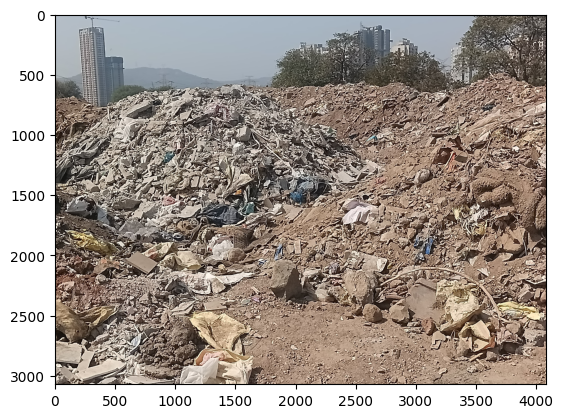

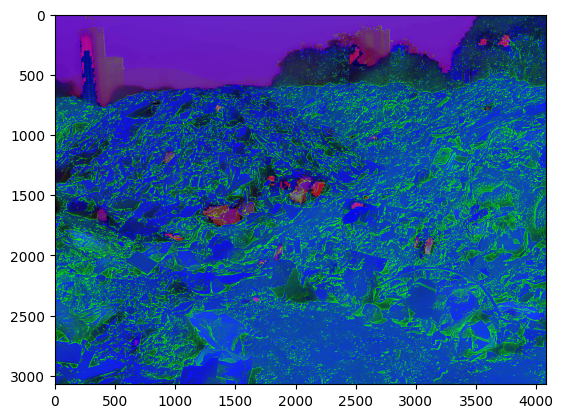

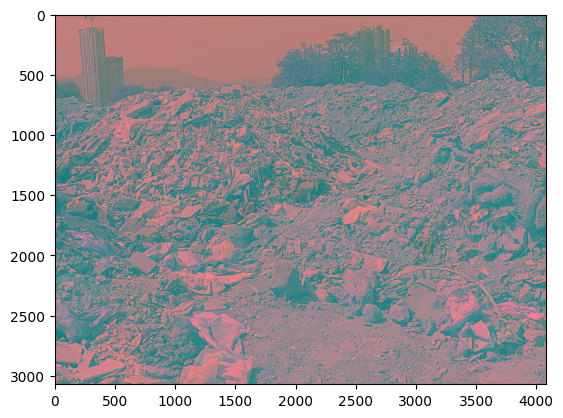

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
image = cv2.imread('3.jpeg')

# Convert to HSV color space
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()
plt.imshow(hsv)
plt.show()
plt.imshow(lab)
plt.show()

### Texture Segmentation

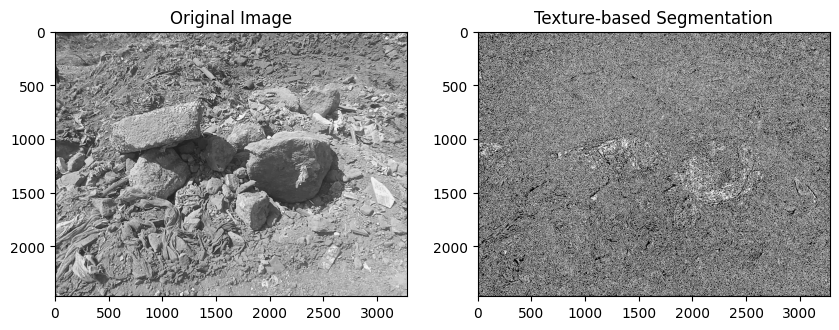

In [1]:
import cv2
import numpy as np
from skimage.feature import local_binary_pattern
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Parameters for LBP
radius = 3
n_points = 8 * radius

# Read the image and convert to grayscale
image = cv2.imread('1.jpeg', cv2.IMREAD_GRAYSCALE)

# Calculate LBP
lbp = local_binary_pattern(image, n_points, radius, method='uniform')

# Flatten the LBP image to create a feature vector
features = lbp.reshape(-1, 1)

# Perform K-means clustering
kmeans = KMeans(n_clusters=2, random_state=42).fit(features)
labels = kmeans.labels_.reshape(image.shape)

# Create segmented image based on labels
segmented_image = np.zeros_like(image)
segmented_image[labels == 0] = 0  # Background or one hill
segmented_image[labels == 1] = 255  # Another hill

# Display the original and segmented images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(segmented_image, cmap='gray')
plt.title('Texture-based Segmentation')

plt.show()
